<a href="https://colab.research.google.com/github/srirambtechit/msc-project/blob/main/Project_Umpire_Nonumpire_Classification_Model1_Detectron2_v1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Umpire Non-umpire frame detection model

### Steps followed

In notebook, we will walk through the steps required to train Detectron2 on  custom umpire dataset.

To train our detector we take the following steps:

* Install Detectron2 dependencies
* Current colab environment details
* Download custom Detectron2 object detection data
* Visualize Detectron2 training data
* Write our Detectron2 Training configuration
* Run Detectron2 training
* Evaluate Detectron2 performance
* Run Detectron2 inference on test images


# Install Detectron2 dependencies

In [ ]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
     |████████████████████████████████| 703.8MB 25kB/s 
     |████████████████████████████████| 6.6MB 17.7MB/s 
  Found existing installation: torch 1.7.0+cu101
    Uninstalling torch-1.7.0+cu101:
      Successfully uninstalled torch-1.7.0+cu101
  Found existing installation: torchvision 0.8.1+cu101
    Uninstalling torchvision-0.8.1+cu101:
      Successfully uninstalled torchvision-0.8.1+cu101
     |████████████████████████████████| 276kB 8.7MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp36-cp36m-linux_x86_64.whl size=44075 sha256=e5f9827cf5f659080adfb18aeaa09722ed0f21f682b2b8f08dcebfa9d92d9173
  Stored in directory: /root/.cache/pip/wheels/ad/56/bc/1522f864feb2a358ea6f1a92b4798d69ac783a28e80567a18b
Successfully built pyyaml
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip

In [ ]:
# install detectron2:
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html
     |████████████████████████████████| 6.2MB 5.2MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.2.post20201122-cp36-none-any.whl size=44456 sha256=5d4c832c42bc4b80bfac9c1529aeb6d9f98a747afc6c2bae25afbe7295fe4cde
  Stored in directory: /root/.cache/pip/wheels/33/7b/ec/59dffd0a0aa995739aad60ac97e70252247e9d17eae69c1cee
Successfully built fvcore


In [ ]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog

# Current colab environment details

In [ ]:
# Detectron2 environment details
!python3 -m detectron2.utils.collect_env

------------------------  ---------------------------------------------------------------
sys.platform              linux
Python                    3.6.9 (default, Oct  8 2020, 12:12:24) [GCC 8.4.0]
numpy                     1.18.5
detectron2                0.1.3 @/usr/local/lib/python3.6/dist-packages/detectron2
detectron2 compiler       GCC 7.3
detectron2 CUDA compiler  10.1
detectron2 arch flags     sm_35, sm_37, sm_50, sm_52, sm_60, sm_61, sm_70, sm_75
DETECTRON2_ENV_MODULE     <not set>
PyTorch                   1.5.0+cu101 @/usr/local/lib/python3.6/dist-packages/torch
PyTorch debug build       False
CUDA available            True
GPU 0                     Tesla T4
CUDA_HOME                 /usr/local/cuda
NVCC                      Cuda compilation tools, release 10.1, V10.1.243
Pillow                    7.0.0
torchvision               0.6.0+cu101 @/usr/local/lib/python3.6/dist-packages/torchvision
torchvision arch flags    sm_35, sm_50, sm_60, sm_70, sm_75
fvcore                 

In [ ]:
# Current allocated GPU configuration
!nvidia-smi

Mon Nov 30 09:31:32 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 455.38       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P8     9W /  70W |     10MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# Download custom Detectron2 object detection data

In [ ]:
# # dataset
!curl -L "https://app.roboflow.com/ds/ZqgxzcQXpD?key=guD81ZLeN3" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   887  100   887    0     0    821      0  0:00:01  0:00:01 --:--:--   820
100 32.5M  100 32.5M    0     0  16.4M      0  0:00:01  0:00:01 --:--:-- 16.4M
Archive:  roboflow.zip
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/_annotations.coco.json  
 extracting: test/non_umpire_100_jpg.rf.20bd52292e4ea14fbe09e20d947b5191.jpg  
 extracting: test/non_umpire_126_jpg.rf.0737f33c64cf2a501092bd35d2608cfe.jpg  
 extracting: test/non_umpire_127_jpg.rf.f4619005d0e699a0a6c01ff199937037.jpg  
 extracting: test/non_umpire_128_jpg.rf.5610cc7a355f76714c3420bc4461a8d3.jpg  
 extracting: test/non_umpire_132_jpg.rf.7c1722a81ee97bb3e51a8acd7a2f4bb1.jpg  
 extracting: test/non_umpire_154_jpg.rf.3942cea82f860b3dcff72d9fdb8278ba.jpg  
 extracting: test/non_umpire_206_jpg.rf.f1dd0a1e9432afaf482a97d11e6907b3.jpg  
 extract

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/train/t.coco.json", "/content/train")
register_coco_instances("my_dataset_val", {}, "/content/valid/t.coco.json", "/content/valid")
register_coco_instances("my_dataset_test", {}, "/content/test/t.coco.json", "/content/test")

# Visualize Detectron2 training data

WARNING [11/30 11:06:07 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/30 11:06:07 d2.data.datasets.coco]: Loaded 951 images in COCO format from /content/train/t.coco.json


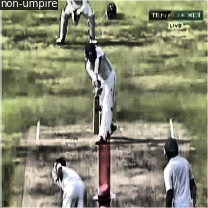

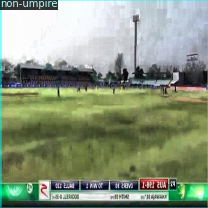

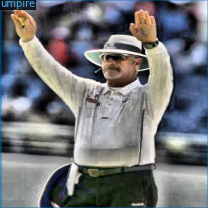

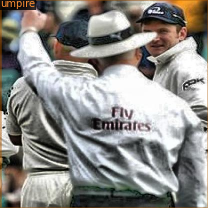

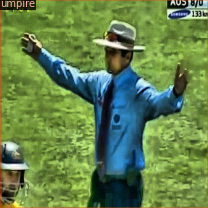

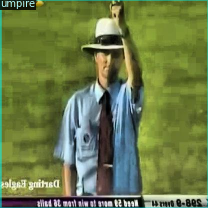

In [ ]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 6):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

# Train Custom Detectron2 Detector

In [ ]:
#We are importing our own Trainer Module here to use the COCO validation evaluation during training. Otherwise no validation eval occurs.

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [ ]:
# from detectron2.tools.train_net import Trainer
# from detectron2.engine import DefaultTrainer
# select from modelzoo here: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md#coco-object-detection-baselines

from detectron2.config import get_cfg
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001

cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 1500 #adjust up if val mAP is still rising, adjust down if overfit
cfg.SOLVER.STEPS = (1000, 1500)
cfg.SOLVER.GAMMA = 0.05

cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3 #your number of classes + 1

cfg.TEST.EVAL_PERIOD = 500

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[11/30 11:06:56 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_68b088.pkl: 421MB [00:05, 78.8MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (12, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (12,) in the model! You might want to double check if this is expected.


[11/30 11:07:07 d2.engine.train_loop]: Starting training from iteration 0
[11/30 11:07:44 d2.utils.events]:  eta: 0:44:59  iter: 19  total_loss: 2.016  loss_cls: 1.365  loss_box_reg: 0.593  loss_rpn_cls: 0.022  loss_rpn_loc: 0.034  time: 1.8228  data_time: 0.0315  lr: 0.000020  max_mem: 7236M
[11/30 11:08:21 d2.utils.events]:  eta: 0:44:22  iter: 39  total_loss: 1.667  loss_cls: 1.084  loss_box_reg: 0.585  loss_rpn_cls: 0.022  loss_rpn_loc: 0.030  time: 1.8311  data_time: 0.0081  lr: 0.000040  max_mem: 7236M
[11/30 11:09:00 d2.utils.events]:  eta: 0:45:37  iter: 59  total_loss: 1.300  loss_cls: 0.657  loss_box_reg: 0.586  loss_rpn_cls: 0.021  loss_rpn_loc: 0.032  time: 1.8864  data_time: 0.0139  lr: 0.000060  max_mem: 7236M
[11/30 11:09:41 d2.utils.events]:  eta: 0:45:45  iter: 79  total_loss: 1.046  loss_cls: 0.439  loss_box_reg: 0.568  loss_rpn_cls: 0.013  loss_rpn_loc: 0.024  time: 1.9255  data_time: 0.0092  lr: 0.000080  max_mem: 7236M
[11/30 11:10:22 d2.utils.events]:  eta: 0:45:4

In [ ]:
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [11/30 12:00:34 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/30 12:00:34 d2.data.datasets.coco]: Loaded 45 images in COCO format from /content/test/t.coco.json
[11/30 12:00:34 d2.data.build]: Distribution of instances among all 3 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|  isumpire  | 0            | non-umpire | 18           |   umpire   | 27           |
|            |              |            |              |            |              |
|   total    | 45           |            |              |            |              |
[11/30 12:00:34 d2.data.common]: Serializing 45 elements to byte tensors and concatenating them all ...
[11/30 12:00:34 d2.data.common]: Serialized dataset takes 0.01 MiB
[11/30 12:00:34 d2.evaluation.evaluator]: Start inference on 45 images
[11/3

OrderedDict([('bbox',
              {'AP': 93.47007589197054,
               'AP-isumpire': nan,
               'AP-non-umpire': 96.11837183718373,
               'AP-umpire': 90.82177994675735,
               'AP50': 94.11166005038639,
               'AP75': 94.11166005038639,
               'APl': 93.47007589197054,
               'APm': nan,
               'APs': nan})])

# Inference with Detectron2 Saved Weights

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test")

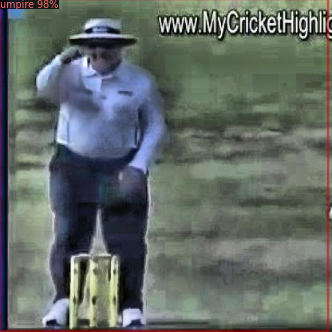

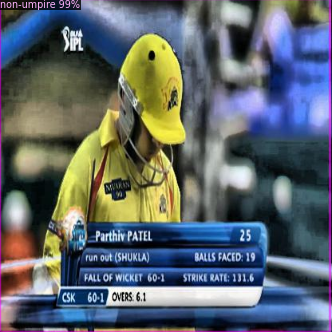

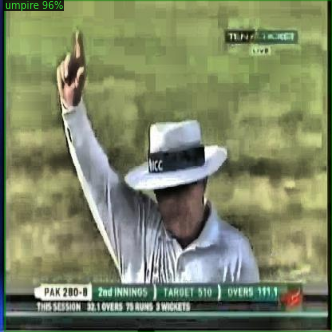

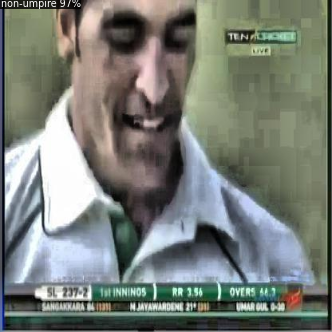

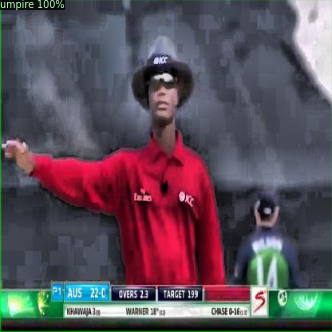

...

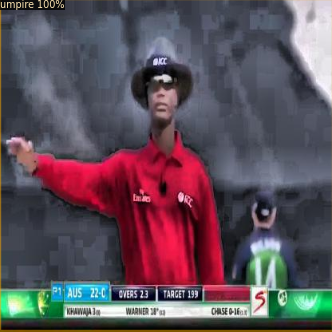

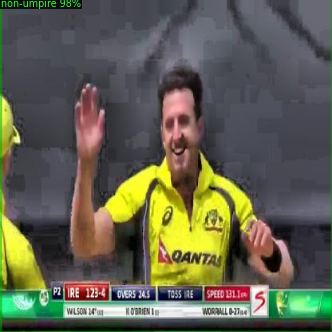

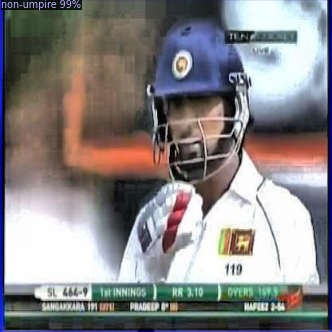

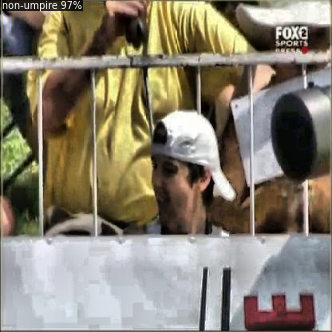

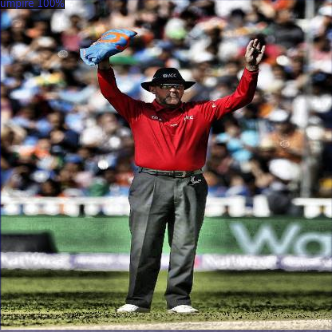

In [ ]:
from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob('/content/test/*jpg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])